# **Object Detection using SSD**
SSD stands for Single Shot Multibox Detector

# Step 1
Mount Drive, Include Imports

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

# this creates a symbolic link so that now the path /content/gdrive/My\ Drive/ is equal to /mydrive
!ln -s /content/gdrive/My\ Drive/ /mydrive
!ls /mydrive

In [ ]:
import os
import glob
import xml.etree.ElementTree as ET
import pandas as pd
import tensorflow as tf
print(tf.__version__)

2.12.0


Create root project folder (e.g. customTF3)

Under it, create 3 children dirs: data, training, testing

Then, compile your images as a zip/rar file

Similarly, compile the annotations for the images as a zip/rar file

Upload images.rar, annotations.rar, generate_tfrecord.py to customTF3


In [ ]:
# generate_tfrecord.py
from __future__ import division
from __future__ import print_function
from __future__ import absolute_import

import os
import io
import pandas as pd
import tensorflow as tf
import argparse

from PIL import Image
from tqdm import tqdm
from object_detection.utils import dataset_util
from collections import namedtuple, OrderedDict


def __split(df, group):
   data = namedtuple('data', ['filename', 'object'])
   gb = df.groupby(group)
   return [data(filename, gb.get_group(x)) for filename, x in zip(gb.groups.keys(), gb.groups)]


def create_tf_example(group, path, class_dict):
   with tf.io.gfile.GFile(os.path.join(path, '{}'.format(group.filename)), 'rb') as fid:
      encoded_jpg = fid.read()
   encoded_jpg_io = io.BytesIO(encoded_jpg)
   image = Image.open(encoded_jpg_io)
   width, height = image.size

   filename = group.filename.encode('utf8')
   image_format = b'jpg'
   xmins = []
   xmaxs = []
   ymins = []
   ymaxs = []
   classes_text = []
   classes = []

   for index, row in group.object.iterrows():
      if set(['xmin_rel', 'xmax_rel', 'ymin_rel', 'ymax_rel']).issubset(set(row.index)):
         xmin = row['xmin_rel']
         xmax = row['xmax_rel']
         ymin = row['ymin_rel']
         ymax = row['ymax_rel']

      elif set(['xmin', 'xmax', 'ymin', 'ymax']).issubset(set(row.index)):
         xmin = row['xmin'] / width
         xmax = row['xmax'] / width
         ymin = row['ymin'] / height
         ymax = row['ymax'] / height

      xmins.append(xmin)
      xmaxs.append(xmax)
      ymins.append(ymin)
      ymaxs.append(ymax)
      classes_text.append(str(row['class']).encode('utf8'))
      classes.append(class_dict[str(row['class'])])

   tf_example = tf.train.Example(features=tf.train.Features(
       feature={
           'image/height': dataset_util.int64_feature(height),
           'image/width': dataset_util.int64_feature(width),
           'image/filename': dataset_util.bytes_feature(filename),
           'image/source_id': dataset_util.bytes_feature(filename),
           'image/encoded': dataset_util.bytes_feature(encoded_jpg),
           'image/format': dataset_util.bytes_feature(image_format),
           'image/object/bbox/xmin': dataset_util.float_list_feature(xmins),
           'image/object/bbox/xmax': dataset_util.float_list_feature(xmaxs),
           'image/object/bbox/ymin': dataset_util.float_list_feature(ymins),
           'image/object/bbox/ymax': dataset_util.float_list_feature(ymaxs),
           'image/object/class/text': dataset_util.bytes_list_feature(classes_text),
           'image/object/class/label': dataset_util.int64_list_feature(classes), }))
   return tf_example


def class_dict_from_pbtxt(pbtxt_path):
   # open file, strip \n, trim lines and keep only
   # lines beginning with id or display_name

   with open(pbtxt_path, 'r', encoding='utf-8-sig') as f:
      data = f.readlines()

   name_key = None
   if any('display_name:' in s for s in data):
      name_key = 'display_name:'
   elif any('name:' in s for s in data):
      name_key = 'name:'

   if name_key is None:
      raise ValueError(
          "label map does not have class names, provided by values with the 'display_name' or 'name' keys in the contents of the file"
      )

   data = [l.rstrip('\n').strip() for l in data if 'id:' in l or name_key in l]

   ids = [int(l.replace('id:', '')) for l in data if l.startswith('id')]
   names = [
       l.replace(name_key, '').replace('"', '').replace("'", '').strip() for l in data
       if l.startswith(name_key)]

   # join ids and display_names into a single dictionary
   class_dict = {}
   for i in range(len(ids)):
      class_dict[names[i]] = ids[i]

   return class_dict


if __name__ == '__main__':
   parser = argparse.ArgumentParser(
       description='Create a TFRecord file for use with the TensorFlow Object Detection API.',
       formatter_class=argparse.RawDescriptionHelpFormatter)
   parser.add_argument('csv_input', metavar='csv_input', type=str, help='Path to the CSV input')
   parser.add_argument('pbtxt_input',
                       metavar='pbtxt_input',
                       type=str,
                       help='Path to a pbtxt file containing class ids and display names')
   parser.add_argument('image_dir',
                       metavar='image_dir',
                       type=str,
                       help='Path to the directory containing all images')
   parser.add_argument('output_path',
                       metavar='output_path',
                       type=str,
                       help='Path to output TFRecord')

   args = parser.parse_args()

   class_dict = class_dict_from_pbtxt(args.pbtxt_input)

   writer = tf.compat.v1.python_io.TFRecordWriter(args.output_path)
   path = os.path.join(args.image_dir)
   examples = pd.read_csv(args.csv_input)
   grouped = __split(examples, 'filename')

   for group in tqdm(grouped, desc='groups'):
      tf_example = create_tf_example(group, path, class_dict)
      writer.write(tf_example.SerializeToString())

   writer.close()
   output_path = os.path.join(os.getcwd(), args.output_path)
   print('Successfully created the TFRecords: {}'.format(output_path))

# Step 2
Install object detection API, Test model builder

In [ ]:
# clone the tensorflow models on the colab cloud vm
!git clone --q https://github.com/tensorflow/models.git

#navigate to /models/research folder to compile protos
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .


/content/models/research
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.6/14.6 MB 49.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 87.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.6/28.6 MB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 8.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 14.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.4/269.4 kB 28.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 68.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 5.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 241.2/241.2 kB 27.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.5/6.

In [ ]:
!pip uninstall pyyaml

Found existing installation: PyYAML 5.3.1
Uninstalling PyYAML-5.3.1:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/PyYAML-5.3.1.dist-info/*
    /usr/local/lib/python3.10/dist-packages/yaml/*
Proceed (Y/n)? y
  Successfully uninstalled PyYAML-5.3.1


In [ ]:
!pip uninstall numpy

Found existing installation: numpy 1.24.3
Uninstalling numpy-1.24.3:
  Would remove:
    /usr/local/bin/f2py
    /usr/local/bin/f2py3
    /usr/local/bin/f2py3.10
    /usr/local/lib/python3.10/dist-packages/numpy-1.24.3.dist-info/*
    /usr/local/lib/python3.10/dist-packages/numpy.libs/libgfortran-040039e1.so.5.0.0
    /usr/local/lib/python3.10/dist-packages/numpy.libs/libopenblas64_p-r0-15028c96.3.21.so
    /usr/local/lib/python3.10/dist-packages/numpy.libs/libquadmath-96973f99.so.0.0.0
    /usr/local/lib/python3.10/dist-packages/numpy/*
Proceed (Y/n)? y
  Successfully uninstalled numpy-1.24.3


In [ ]:
!pip install numpy==1.23.3

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 38.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 1.2.1 requires PyYAML, which is not installed.
astropy 5.2.2 requires PyYAML>=3.13, which is not installed.
bokeh 3.1.1 requires PyYAML>=3.10, which is not installed.
flax 0.7.0 requires PyYAML>=5.4.1, which is not installed.
orbax-checkpoint 0.3.1 requires pyyaml, which is not installed.
tf-models-official 2.13.1 requires pyyaml<5.4.0,>=5.1, which is not installed.


In [ ]:
!pip install pyyaml

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 705.5/705.5 kB 9.8 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.13.1 requires pyyaml<5.4.0,>=5.1, but you have pyyaml 6.0.1 which is incompatible.


In [ ]:
!pip install tensorflow-object-detection-api

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 577.4/577.4 kB 7.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 121.9/121.9 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 84.9/84.9 kB 11.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 18.7 MB/s eta 0:00:00
  Created wheel for tensorflow-object-detection-api: filename=tensorflow_object_detection_api-0.1.1-py3-none-any.whl size=844490 sha256=d9283ec27bac2334368838ea476eaafde17e63c27216fa767c2587d3acf23f05
  Stored in directory: /root/.cache/pip/wheels/8a/55/68/c084bc2cd93c41fd8f7e2ef9e6bbcb2c35a3e4b49e42044d02
Successfully built tensorflow-object-detection-api


In [ ]:
%cd models/research

# Compile protos.
!protoc object_detection/protos/*.proto --python_out=.

# Install TensorFlow Object Detection API.
!cp object_detection/packages/tf2/setup.py .
!python -m pip install .

/content/models/research
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Using cached PyYAML-5.3.1-cp310-cp310-linux_x86_64.whl
  Created wheel for object-detection: filename=object_detection-0.1-py3-none-any.whl size=1697172 sha256=90b0809d72ab240a20fffe6b1ac55629424a78d16c4e018a55474132ae4d1366
  Stored in directory: /tmp/pip-ephem-wheel-cache-6u00pfm_/wheels/53/dd/70/2de274d6c443c69d367bd6a5606f95e5a6df61aacf1435ec0d
Successfully built object-detection
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.1
    Uninstalling PyYAML-6.0.1:
      Successfully uninstalled PyYAML-6.0.1
  Attempting uninstall: object-detection
    Found existing installation: object-detection 0.1
    Uninstalling object-detection-0.1:
      Successfully uninstalled object-detection-0.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflic

In [ ]:
# testing the model builder
!python3 /content/models/research/object_detection/builders/model_builder_tf2_test.py

2023-08-03 05:52:58.000750: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-03 05:52:59.485910: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-03 05:53:02.811112: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-08-03 05:53:03.364526: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [ ]:
# First, navigate to the correct directory (if not already there)
%cd /mydrive/customTF3/data/

# Install unrar (if not already installed, but it's usually available in Colab)
!apt-get -qq install unrar

# Extract the images.rar file
!unrar x /content/gdrive/MyDrive/customTF3/images.rar

# Extract the annotations.rar file
!unrar x /content/gdrive/MyDrive/customTF3/annotations.rar


/content/gdrive/My Drive/customTF3/data

UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/gdrive/MyDrive/customTF3/images.rar

Creating    28-7                                                      OK
Extracting  28-7/WIN_20230728_14_13_59_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_55_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_43_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_40_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_36_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_32_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_29_Pro.jpg                             0%  OK 
Extracting  28-7/WIN_20230728_14_13_26_Pro.jpg                             1%  OK 
Extracting  2

# Step 3
Create labels, Pretraining

In [ ]:
# # Move 20% of the images (15 images) to the 'test_labels' directory
# !find /mydrive/customTF2/data/images -type f | shuf -n 15 | xargs -I{} mv {} /mydrive/customTF2/data/test_labels/

# # Move the remaining 80% of the images (60 images) to the 'train_labels' directory
# !find /mydrive/customTF2/data/images -type f | xargs -I{} mv {} /mydrive/customTF2/data/train_labels/

#creating two dir for training and testing
!mkdir test_labels train_labels

# lists the files inside 'annotations' in a random order (not really random, by their hash value instead)
# Moves the first 274/1370 labels (20% of the labels) to the testing dir: `test_labels`
!ls annotations/* | sort -R | head -15 | xargs -I{} mv {} test_labels/


# Moves the rest of the labels ( 1096 labels ) to the training dir: `train_labels`
!ls annotations/* | xargs -I{} mv {} train_labels/

In [ ]:
#adjusted from: https://github.com/datitran/raccoon_dataset
import os
import glob
import pandas as pd
import xml.etree.ElementTree as ET


def xml_to_csv(path):
  classes_names = []
  xml_list = []

  for xml_file in glob.glob(path + '/*.xml'):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    for member in root.findall('object'):
      classes_names.append(member[0].text)
      value = (root.find('filename').text  ,
               int(root.find('size')[0].text),
               int(root.find('size')[1].text),
               member[0].text,
               int(member[4][0].text),
               int(member[4][1].text),
               int(member[4][2].text),
               int(member[4][3].text))
      xml_list.append(value)
  column_name = ['filename', 'width', 'height', 'class', 'xmin', 'ymin', 'xmax', 'ymax']
  xml_df = pd.DataFrame(xml_list, columns=column_name)
  classes_names = list(set(classes_names))
  classes_names.sort()
  return xml_df, classes_names

for label_path in ['train_labels', 'test_labels']:
  image_path = os.path.join(os.getcwd(), label_path)
  xml_df, classes = xml_to_csv(label_path)
  xml_df.to_csv(f'{label_path}.csv', index=None)
  print(f'Successfully converted {label_path} xml to csv.')

label_map_path = os.path.join("label_map.pbtxt")
pbtxt_content = ""

for i, class_name in enumerate(classes):
    pbtxt_content = (
        pbtxt_content
        + "item {{\n    id: {0}\n    name: '{1}'\n}}\n\n".format(i + 1, class_name)
    )
pbtxt_content = pbtxt_content.strip()
with open(label_map_path, "w") as f:
    f.write(pbtxt_content)
    print('Successfully created label_map.pbtxt ')

Successfully converted train_labels xml to csv.
Successfully converted test_labels xml to csv.
Successfully created label_map.pbtxt 


In [ ]:
#Usage:
#!python generate_tfrecord.py output.csv output_pb.txt /path/to/images output.tfrecords

#For train.record
!python /mydrive/customTF3/generate_tfrecord.py train_labels.csv  label_map.pbtxt images/ train.record

#For test.record
!python /mydrive/customTF3/generate_tfrecord.py test_labels.csv  label_map.pbtxt images/ test.record


2023-08-03 05:55:53.401840: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-03 05:55:54.950472: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
groups:  77% 587/763 [00:01<00:00, 363.82it/s]
Traceback (most recent call last):
  File "/mydrive/customTF3/generate_tfrecord.py", line 137, in <module>
    tf_example = create_tf_example(group, path, class_dict)
  File "/mydrive/customTF3/generate_tfrecord.py", line 57, in create_tf_example
    classes.append(class_dict[str(row['class'])])
KeyError: 'cable gland\\'
2023-08-03 05:56:00.121822: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enab

In [ ]:
%cd /mydrive/customTF3/data/

/content/gdrive/My Drive/customTF3/data


In [ ]:
#Download the pre-trained model ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz into the data folder & unzip it.

'''!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz'''

!wget http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
!tar -xzvf ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz

--2023-08-03 05:56:18--  http://download.tensorflow.org/models/object_detection/tf2/20200711/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 142.250.99.128, 2607:f8b0:400e:c0c::80
Connecting to download.tensorflow.org (download.tensorflow.org)|142.250.99.128|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20515344 (20M) [application/x-tar]
Saving to: ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’

ssd_mobilenet_v2_fp 100%[===================>]  19.56M  75.1MB/s    in 0.3s    

2023-08-03 05:56:18 (75.1 MB/s) - ‘ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.tar.gz’ saved [20515344/20515344]

ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/ckpt-0.data-00000-of-00001
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8/checkpoint/checkpoint
ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-

In [ ]:
#copy the edited config file from the configs/tf2 directory to the data/ folder in your drive
'''!cp /content/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config /mydrive/customTF3/data'''
!cp /content/models/research/object_detection/configs/tf2/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config /mydrive/customTF3/data

Now, edit the above config file

*   change ***num_classes*** to number of your classes.
*   change ***test.record*** path, ***train.record*** path & ***labelmap*** path to the paths where you have created these files (paths should be relative to your current working directory while training).
* change ***fine_tune_checkpoint*** to the path of the directory where the downloaded checkpoint from the previous step is.
* change ***fine_tune_checkpoint_type*** with value **classification** or **detection** depending on the type..
* change ***batch_size*** to any multiple of 8 depending upon the capability of your GPU.
(eg:- 24,128,...,512).Mine is set to 64.
* change ***num_steps*** to number of steps you want the detector to train.

In [ ]:
#load tensorboard

%load_ext tensorboard
%tensorboard --logdir '/content/gdrive/MyDrive/customTF3/training'

<IPython.core.display.Javascript object>

# Step 4
Training

In [ ]:
%cd /content/models/research/object_detection

/content/models/research/object_detection


In [ ]:
# Run the command below from the content/models/research/object_detection directory

"""
PIPELINE_CONFIG_PATH=path/to/pipeline.config
MODEL_DIR=path to training checkpoints directory
NUM_TRAIN_STEPS=50000
SAMPLE_1_OF_N_EVAL_EXAMPLES=1

python model_main_tf2.py -- \
--model_dir=$MODEL_DIR --num_train_steps=$NUM_TRAIN_STEPS \
--sample_1_of_n_eval_examples=$SAMPLE_1_OF_N_EVAL_EXAMPLES \
--pipeline_config_path=$PIPELINE_CONFIG_PATH \
--alsologtostderr

!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF3/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --model_dir=/mydrive/customTF3/training --alsologtostderr
"""

!python model_main_tf2.py --pipeline_config_path=/mydrive/customTF3/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --model_dir=/mydrive/customTF3/training --alsologtostderr

2023-08-03 06:02:22.700755: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-03 06:02:23.690648: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-03 06:02:26.730245: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-08-03 06:02:26.782178: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

Retraining ( in case you get disconnected )


If you get disconnected or lose your session on colab vm, you can start your training where you left off as the checkpoint is saved on your drive inside the ***training*** folder.

Note that since we have all the files required for training like the record files,our edited pipeline config file,the label_map file and the model checkpoint folder, therefore we do not need to create these again.

**The model_main_tf2.py script saves the checkpoint every 1000 steps.** The training automatically restarts from the last saved checkpoint itself.

However, if you see that it doesn't restart training from the last checkpoint you can make 1 change in the pipeline config file. Change **fine_tune_checkpoint** to where your latest trained checkpoints have been written and have it point to the latest checkpoint as shown below:


```
fine_tune_checkpoint: "/mydrive/customTF3/training/ckpt-X" (where ckpt-X is the latest checkpoint)

```


# Testing


In [ ]:
##Export inference graph
!python exporter_main_v2.py --trained_checkpoint_dir=/mydrive/customTF3/training --pipeline_config_path=/content/gdrive/MyDrive/customTF3/data/ssd_mobilenet_v2_fpnlite_320x320_coco17_tpu-8.config --output_directory /mydrive/customTF3/data/inference_graph

2023-08-03 06:29:28.706034: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-08-03 06:29:29.977408: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
2023-08-03 06:29:33.910347: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2023-08-03 06:29:34.010516: I tensorflow/compiler/xla/stream_executor/cuda/cuda_gpu_executor.cc:995] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA n

In [ ]:
!pip install --upgrade Image
!pip uninstall pillow
!pip install pillow==9.5

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 18.2 MB/s eta 0:00:00
  Created wheel for Image: filename=image-1.5.33-py2.py3-none-any.whl size=19482 sha256=d0b04f78b73f074ebad8a28dbc0c8c7e6028969bd2295d6f5c2c83cb290805f7
  Stored in directory: /root/.cache/pip/wheels/70/0c/a4/7cfa53a5c6225c2db2bfec08e782b43d0f25fdae2e995b69be
Successfully built Image
Found existing installation: Pillow 9.4.0
Uninstalling Pillow-9.4.0:
  Would remove:
    /usr/local/lib/python3.10/dist-packages/PIL/*
    /usr/local/lib/python3.10/dist-packages/Pillow-9.4.0.dist-info/*
    /usr/local/lib/python3.10/dist-packages/Pillow.libs/libXau-154567c4.so.6.0.0
    /usr/local/lib/python3.10/dist-packages/Pillow.libs/libbrotlicommon-92722cb2.so.1
    /usr/local/lib/python3.10/dist-packages/Pillow.libs/libbrotlidec-db4b3db6.so.1.0.9
    /usr/local/lib/python3.10/dist-packages/Pillow.libs/libfreetype-9ff7e0a7.so.6.18.3
    /usr/local/lib/python3.10/dist-packages/Pillow

In [ ]:
import cv2
import numpy as np

def within_boundary_check(image, bin, detection):
  y_min = int(detection[0] * im_height)
  x_min = int(detection[1] * im_width)
  y_max = int(detection[2] * im_height)
  x_max = int(detection[3] * im_width)
  if y_min >= int(bin[0]) and x_min >= int(bin[1]) and y_max <= int(bin[2]) and x_max <= int(bin[3]) and detection_scores[i] > 0.4:
    return True
  else:
    return False

## Images

Labeling

Loading model...Done!


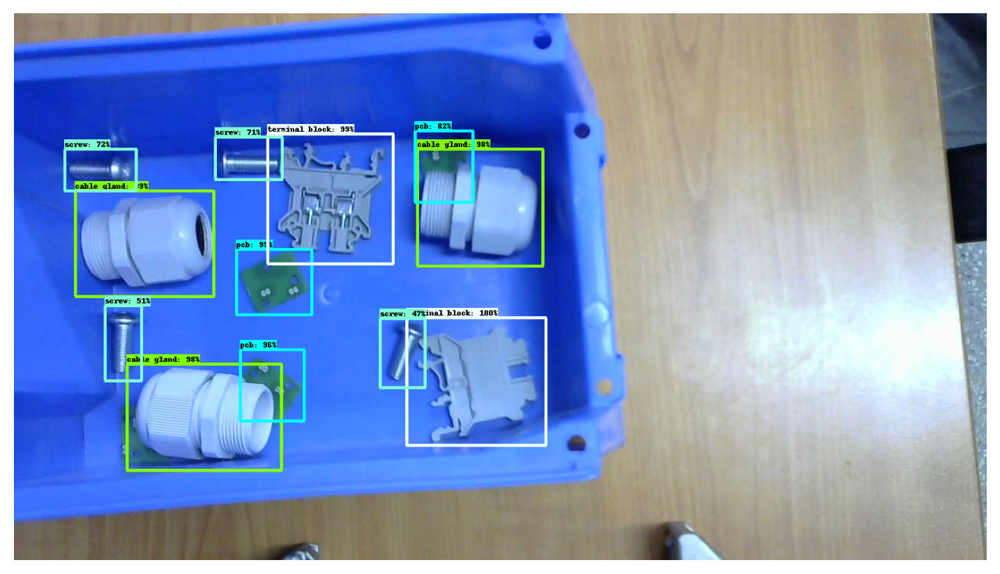

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
#import numpy as np
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

IMAGE_SIZE = (9, 6) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF3/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/customTF3/testing/WIN_20230731_09_45_31_Pro.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'],
      detections['detection_classes'],
      detections['detection_scores'],
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.4, # Adjust this value to set the minimum probability boxes to be classified as True
      agnostic_mode=False)
%matplotlib inline
plt.figure(figsize=IMAGE_SIZE, dpi=200)
plt.axis("off")
plt.imshow(image_np_with_detections)
plt.show()

+Count

Loading model...Done!
{'terminal block': 2, 'cable gland': 3, 'pcb': 3, 'screw': 4}


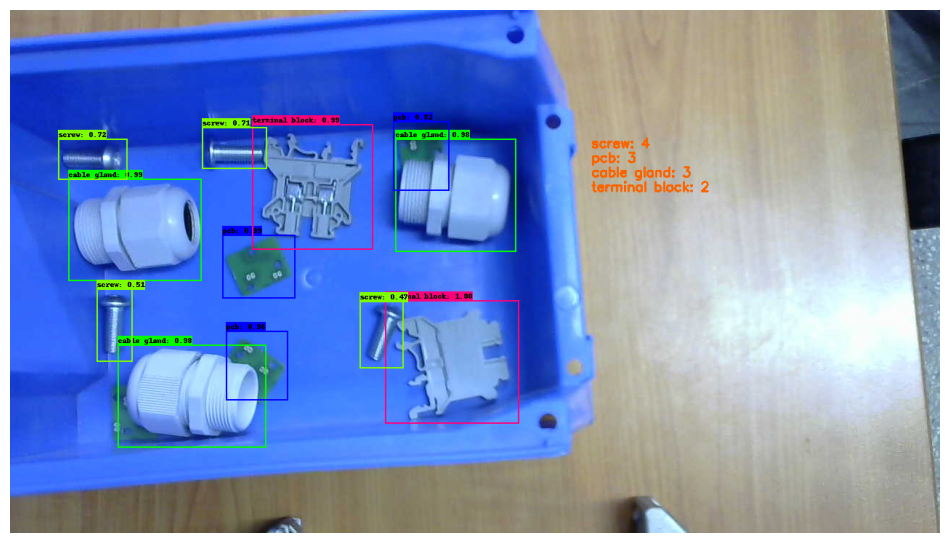

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import copy
import cv2

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF3/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/customTF3/testing/WIN_20230731_09_45_31_Pro.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()


# Define set to store counts
class_counts = {}

# Get the detection class indices and corresponding scores
detection_classes = detections['detection_classes']
detection_scores = detections['detection_scores']

# Loop through the detections
for i in range(num_detections):
    # Get the class index and score for the current detection
    class_index = int(detection_classes[i])
    score = detection_scores[i]
    if score < 0.4:
      continue
    class_name = category_index[class_index]['name']

    if class_name == 'cable gland':
      box_color = (0, 255, 0)
    elif class_name == 'pcb':
        box_color = (0, 0, 255)
    elif class_name == 'terminal block':
        box_color = (255, 0, 125)
    elif class_name == 'screw':
        box_color = (125, 255, 0)
    elif class_name == 'bin':
        box_color = (0, 125, 255)
    class_counts[class_name] = class_counts.get(class_name, 0) + 1

    # Retrieve the bounding box coordinates for the current detection
    ymin, xmin, ymax, xmax = detections['detection_boxes'][i]
    # Scale the bounding box coordinates to match the image size
    im_height, im_width, _ = image_np.shape
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)

    # Draw the bounding box on the image
    viz_utils.draw_bounding_box_on_image_array(
        image_np_with_detections,
        ymin,
        xmin,
        ymax,
        xmax,
        color=box_color,
        thickness=2,
        display_str_list=[f'{class_name}: {score:.2f}']
    )

print(class_counts)

i = 0
for cl in class_counts:
  annotation = f"{cl}: {class_counts[cl]}"
  cv2.putText(image_np_with_detections, annotation, (800, 250-(i * 20)),
              cv2.FONT_HERSHEY_SIMPLEX, 0.6, (250,100,0), 2)
  i+=1

# Display the image with colored bounding boxes
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis('off')
plt.show()

+Classify

Loading model...Done!
{'terminal block': 2, 'pcb': 3, 'screw': 4}


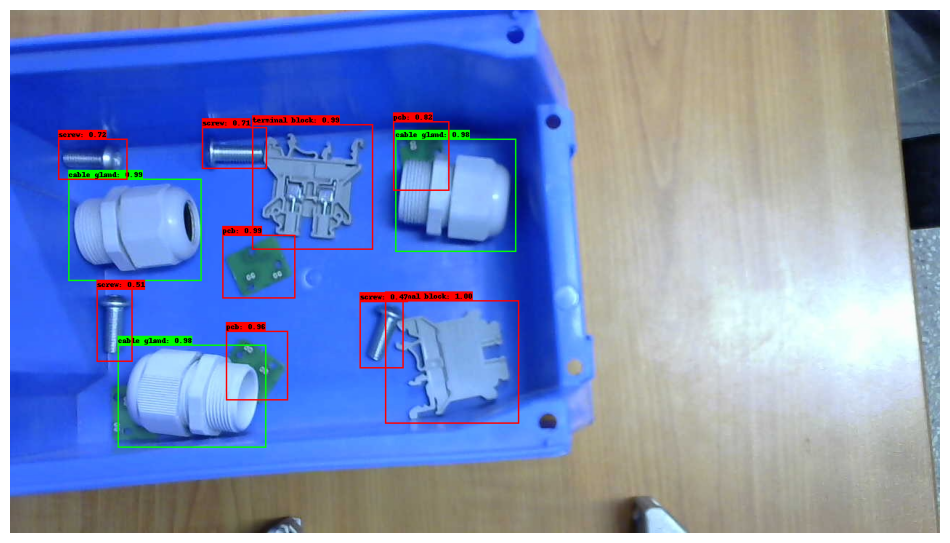

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import copy
import cv2

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF3/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/customTF3/testing/WIN_20230731_09_45_31_Pro.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()


# Define colors for the bounding boxes
green_color = (0, 255, 0)
red_color = (255, 0, 0)

# Define set to store counts
class_counts = {}

# Get the detection class indices and corresponding scores
detection_classes = detections['detection_classes']
detection_scores = detections['detection_scores']

# Loop through the detections
for i in range(num_detections):
    # Get the class index and score for the current detection
    class_index = int(detection_classes[i])
    score = detection_scores[i]
    if score < 0.4:
      continue
    class_name = category_index[class_index]['name']

    if class_name == 'cable gland':
      box_color = green_color
    else:
      box_color = red_color
      class_counts[class_name] = class_counts.get(class_name, 0) + 1

    # Retrieve the bounding box coordinates for the current detection
    ymin, xmin, ymax, xmax = detections['detection_boxes'][i]
    # Scale the bounding box coordinates to match the image size
    im_height, im_width, _ = image_np.shape
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)

    # Draw the bounding box on the image
    viz_utils.draw_bounding_box_on_image_array(
        image_np_with_detections,
        ymin,
        xmin,
        ymax,
        xmax,
        color=box_color,
        thickness=2,
        display_str_list=[f'{class_name}: {score:.2f}']
    )

    if box_color == green_color:
      continue

print(class_counts)

# Display the image with colored bounding boxes
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis('off')
plt.show()

+Count+Classify

Loading model...Done!
{'terminal block': 2, 'pcb': 3, 'screw': 4}


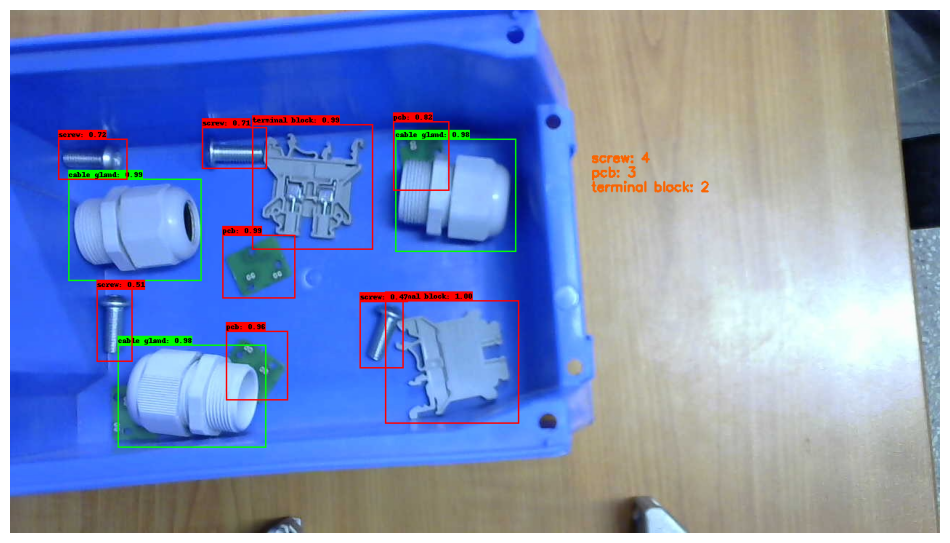

In [ ]:
#Loading the saved_model
import tensorflow as tf
import time
import numpy as np
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')
from PIL import Image, ImageDraw, ImageFont
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils
import copy
import cv2

IMAGE_SIZE = (12, 8) # Output display size as you want
import matplotlib.pyplot as plt
PATH_TO_SAVED_MODEL="/mydrive/customTF3/data/inference_graph/saved_model"
print('Loading model...', end='')

# Load saved model and build the detection function
detect_fn=tf.saved_model.load(PATH_TO_SAVED_MODEL)
print('Done!')

#Loading the label_map
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)
#category_index=label_map_util.create_category_index_from_labelmap([path_to_label_map],use_display_name=True)

def load_image_into_numpy_array(path):

    return np.array(Image.open(path))

image_path = "/content/gdrive/MyDrive/customTF3/testing/WIN_20230731_09_45_31_Pro.jpg"
#print('Running inference for {}... '.format(image_path), end='')

image_np = load_image_into_numpy_array(image_path)

# The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
input_tensor = tf.convert_to_tensor(image_np)
# The model expects a batch of images, so add an axis with `tf.newaxis`.
input_tensor = input_tensor[tf.newaxis, ...]

detections = detect_fn(input_tensor)

# All outputs are batches tensors.
# Convert to numpy arrays, and take index [0] to remove the batch dimension.
# We're only interested in the first num_detections.
num_detections = int(detections.pop('num_detections'))
detections = {key: value[0, :num_detections].numpy()
              for key, value in detections.items()}
detections['num_detections'] = num_detections

# detection_classes should be ints.
detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

image_np_with_detections = image_np.copy()


# Define colors for the bounding boxes
green_color = (0, 255, 0)
red_color = (255, 0, 0)

# Define set to store counts
class_counts = {}

# Get the detection class indices and corresponding scores
detection_classes = detections['detection_classes']
detection_scores = detections['detection_scores']

# Loop through the detections
for i in range(num_detections):
    # Get the class index and score for the current detection
    class_index = int(detection_classes[i])
    score = detection_scores[i]
    if score < 0.4:
      continue
    class_name = category_index[class_index]['name']

    if class_name == 'cable gland':
      box_color = green_color
    else:
      box_color = red_color
      class_counts[class_name] = class_counts.get(class_name, 0) + 1

    # Retrieve the bounding box coordinates for the current detection
    ymin, xmin, ymax, xmax = detections['detection_boxes'][i]
    # Scale the bounding box coordinates to match the image size
    im_height, im_width, _ = image_np.shape
    (left, right, top, bottom) = (xmin * im_width, xmax * im_width, ymin * im_height, ymax * im_height)

    # Draw the bounding box on the image
    viz_utils.draw_bounding_box_on_image_array(
        image_np_with_detections,
        ymin,
        xmin,
        ymax,
        xmax,
        color=box_color,
        thickness=2,
        display_str_list=[f'{class_name}: {score:.2f}']
    )

    if box_color == green_color:
      continue

print(class_counts)

i = 0
for cl in class_counts:
  annotation = f"{cl}: {class_counts[cl]}"
  cv2.putText(image_np_with_detections, annotation, (800, 250-(i * 20)),
              cv2.FONT_HERSHEY_SIMPLEX, 0.6, (250,100,0), 2)
  i+=1

# Display the image with colored bounding boxes
plt.figure(figsize=(12, 8))
plt.imshow(image_np_with_detections)
plt.axis('off')
plt.show()

## Videos

Record video in colab

In [ ]:
from IPython.display import display, Javascript, HTML
from google.colab.output import eval_js
from base64 import b64decode

def record_video(filename):
  js=Javascript("""
    async function recordVideo() {
      const options = { mimeType: "video/webm; codecs=vp9" };
      const div = document.createElement('div');
      const capture = document.createElement('button');
      const stopCapture = document.createElement("button");

      capture.textContent = "Start Recording";
      capture.style.background = "yellow";
      capture.style.color = "black";

      stopCapture.textContent = "Stop Recording";
      stopCapture.style.background = "red";
      stopCapture.style.color = "white";
      div.appendChild(capture);

      const video = document.createElement('video');
      const recordingVid = document.createElement("video");
      video.style.display = 'block';

      const stream = await navigator.mediaDevices.getUserMedia({audio:true, video: true});

      let recorder = new MediaRecorder(stream, options);
      document.body.appendChild(div);
      div.appendChild(video);

      video.srcObject = stream;
      video.muted = true;

      await video.play();

      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      await new Promise((resolve) => {
        capture.onclick = resolve;
      });
      recorder.start();
      capture.replaceWith(stopCapture);

      await new Promise((resolve) => stopCapture.onclick = resolve);
      recorder.stop();
      let recData = await new Promise((resolve) => recorder.ondataavailable = resolve);
      let arrBuff = await recData.data.arrayBuffer();

      // stop the stream and remove the video element
      stream.getVideoTracks()[0].stop();
      div.remove();

      let binaryString = "";
      let bytes = new Uint8Array(arrBuff);
      bytes.forEach((byte) => {
        binaryString += String.fromCharCode(byte);
      })
    return btoa(binaryString);
    }
  """)
  try:
    display(js)
    data=eval_js('recordVideo({})')
    binary=b64decode(data)
    with open(filename,"wb") as video_file:
      video_file.write(binary)
    print(f"Finished recording video at:{filename}")
  except Exception as err:
    print(str(err))

# Set path to save video here
video_path = "/mydrive/customTF3/input.mp4"
record_video(video_path)


Run model on video saved in Drive

Labelling

In [ ]:
import os
import time
import tensorflow as tf
import cv2
import numpy as np

from utils import label_map_util
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

from IPython.display import HTML
from base64 import b64encode

#Path to saved model

PATH_TO_SAVED_MODEL = "/content/gdrive/MyDrive/customTF3/data/inference_graph/saved_model"

# Load label map and obtain class names and ids
#label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)


def visualise_on_image(image, bboxes, labels, scores, thresh):
    (h, w, d) = image.shape
    for bbox, label, score in zip(bboxes, labels, scores):
        if score > thresh:
            xmin, ymin = int(bbox[1]*w), int(bbox[0]*h)
            xmax, ymax = int(bbox[3]*w), int(bbox[2]*h)

            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0,255,0), 2)
            cv2.putText(image, f"{label}: {int(score*100)} %", (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
    return image

if __name__ == '__main__':

    # Load the model
    print("Loading saved model ...")
    detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
    print("Model Loaded!")

    # Video Capture (video_file)
    video_capture = cv2.VideoCapture("/mydrive/customTF3/input.mp4")
    start_time = time.time()

    frame_width = int(video_capture.get(3))
    frame_height = int(video_capture.get(4))
    #fps = int(video_capture.get(5))
    size = (frame_width, frame_height)

    #Initialize video writer
    result = cv2.VideoWriter('/mydrive/customTF3/result.avi', cv2.VideoWriter_fourcc(*'MJPG'),15, size)

    while True:
      ret, frame = video_capture.read()
      if not ret:
          print('Unable to read video / Video ended')
          break

      frame = cv2.flip(frame, 1)
      image_np = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
      # The model expects a batch of images, so also add an axis with `tf.newaxis`.
      input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

      # Pass frame through detector
      detections = detect_fn(input_tensor)

      # Set detection parameters

      score_thresh = 0.4   # Minimum threshold for object detection
      max_detections = 10

      # All outputs are batches tensors.
      # Convert to numpy arrays, and take index [0] to remove the batch dimension.
      # We're only interested in the first num_detections.
      scores = detections['detection_scores'][0, :max_detections].numpy()
      bboxes = detections['detection_boxes'][0, :max_detections].numpy()
      labels = detections['detection_classes'][0, :max_detections].numpy().astype(np.int64)
      labels = [category_index[n]['name'] for n in labels]

      # Display detections
      visualise_on_image(frame, bboxes, labels, scores, score_thresh)

      end_time = time.time()
      fps = int(1/(end_time - start_time))
      start_time = end_time
      cv2.putText(frame, f"FPS: {fps}", (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 1)
      #cv2_imshow(frame)

      #Write output video
      result.write(frame)

    video_capture.release()


Loading saved model ...
Model Loaded!
Unable to read video / Video ended


Counting

In [ ]:
import os
import time
import tensorflow as tf
import cv2
import numpy as np

from utils import label_map_util
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

from IPython.display import HTML
from base64 import b64encode

#Path to saved model

PATH_TO_SAVED_MODEL = "/content/gdrive/MyDrive/customTF3/data/inference_graph/saved_model"

# Load label map and obtain class names and ids
#label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)


def visualise_on_image(image, bboxes, labels, scores, thresh):
    (h, w, d) = image.shape
    for bbox, label, score in zip(bboxes, labels, scores):
        if score > thresh:
            xmin, ymin = int(bbox[1]*w), int(bbox[0]*h)
            xmax, ymax = int(bbox[3]*w), int(bbox[2]*h)

            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0,255,0), 2)
            cv2.putText(image, f"{label}: {int(score*100)} %", (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
    return image

if __name__ == '__main__':

    # Load the model
    print("Loading saved model ...")
    detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
    print("Model Loaded!")

    # Video Capture (video_file)
    video_capture = cv2.VideoCapture("/mydrive/customTF3/input.mp4")
    start_time = time.time()

    frame_width = int(video_capture.get(3))
    frame_height = int(video_capture.get(4))
    #fps = int(video_capture.get(5))
    size = (frame_width, frame_height)

    #Initialize video writer
    result = cv2.VideoWriter('/mydrive/customTF3/result2.avi', cv2.VideoWriter_fourcc(*'MJPG'),15, size)

    while True:
      ret, frame = video_capture.read()
      if not ret:
          print('Unable to read video / Video ended')
          break

      frame = cv2.flip(frame, 1)
      image_np = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
      # The model expects a batch of images, so also add an axis with `tf.newaxis`.
      input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

      # Pass frame through detector
      detections = detect_fn(input_tensor)


      # Set detection parameters

      score_thresh = 0.4   # Minimum threshold for object detection
      max_detections = 10

      # All outputs are batches tensors.
      # Convert to numpy arrays, and take index [0] to remove the batch dimension.
      # We're only interested in the first num_detections.
      scores = detections['detection_scores'][0, :max_detections].numpy()
      bboxes = detections['detection_boxes'][0, :max_detections].numpy()
      labels = detections['detection_classes'][0, :max_detections].numpy().astype(np.int64)
      labels = [category_index[n]['name'] for n in labels]

      # Define set to store counts
      class_counts = {}

      for label in labels:
        class_counts[label] = class_counts.get(label, 0) + 1

      # Display detections
      visualise_on_image(frame, bboxes, labels, scores, score_thresh)

      end_time = time.time()
      fps = int(1/(end_time - start_time))
      start_time = end_time
      cv2.putText(frame, f"FPS: {fps}", (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 1)

      i = 0
      for cl in class_counts:
        annotation = f"{cl}: {class_counts[cl]}"
        cv2.putText(frame, annotation, (20, 250-(i * 20)),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,125,255), 2)
        i+=1

      #cv2_imshow(frame)

      #Write output video
      result.write(frame)

    video_capture.release()


Loading saved model ...
Model Loaded!
Unable to read video / Video ended


Classifying

In [ ]:
import os
import time
import tensorflow as tf
import cv2
import numpy as np

from utils import label_map_util
from PIL import Image
from google.colab.patches import cv2_imshow
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

from IPython.display import HTML
from base64 import b64encode

#Path to saved model

PATH_TO_SAVED_MODEL = "/content/gdrive/MyDrive/customTF3/data/inference_graph/saved_model"

# Load label map and obtain class names and ids
#label_map = label_map_util.load_labelmap(PATH_TO_LABELS)
category_index=label_map_util.create_category_index_from_labelmap("/mydrive/customTF3/data/label_map.pbtxt",use_display_name=True)


def visualise_on_image(image, bboxes, labels, scores, thresh):
    (h, w, d) = image.shape
    for bbox, label, score in zip(bboxes, labels, scores):
        if score > thresh:
            xmin, ymin = int(bbox[1]*w), int(bbox[0]*h)
            xmax, ymax = int(bbox[3]*w), int(bbox[2]*h)

            cv2.rectangle(image, (xmin, ymin), (xmax, ymax), (0,255,0), 2)
            cv2.putText(image, f"{label}: {int(score*100)} %", (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
    return image

if __name__ == '__main__':

    # Load the model
    print("Loading saved model ...")
    detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)
    print("Model Loaded!")

    # Video Capture (video_file)
    video_capture = cv2.VideoCapture("/mydrive/customTF3/input.mp4")
    start_time = time.time()

    frame_width = int(video_capture.get(3))
    frame_height = int(video_capture.get(4))
    #fps = int(video_capture.get(5))
    size = (frame_width, frame_height)

    #Initialize video writer
    result = cv2.VideoWriter('/mydrive/customTF3/result3.avi', cv2.VideoWriter_fourcc(*'MJPG'),15, size)

    while True:
      ret, frame = video_capture.read()
      if not ret:
          print('Unable to read video / Video ended')
          break

      frame = cv2.flip(frame, 1)
      image_np = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
      # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
      # The model expects a batch of images, so also add an axis with `tf.newaxis`.
      input_tensor = tf.convert_to_tensor(image_np)[tf.newaxis, ...]

      # Pass frame through detector
      detections = detect_fn(input_tensor)


      # Set detection parameters

      score_thresh = 0.4   # Minimum threshold for object detection
      max_detections = 10

      # All outputs are batches tensors.
      # Convert to numpy arrays, and take index [0] to remove the batch dimension.
      # We're only interested in the first num_detections.
      scores = detections['detection_scores'][0, :max_detections].numpy()
      bboxes = detections['detection_boxes'][0, :max_detections].numpy()
      labels = detections['detection_classes'][0, :max_detections].numpy().astype(np.int64)
      labels = [category_index[n]['name'] for n in labels]


      # Display detections
      for i in range(max_detections):
        (h, w, d) = frame.shape
        if scores[i] > score_thresh:
            xmin, ymin = int(bboxes[i][1]*w), int(bboxes[i][0]*h)
            xmax, ymax = int(bboxes[i][3]*w), int(bboxes[i][2]*h)

            box_color = (0, 0, 0)
            if labels[i] == 'terminal block':
                box_color = (0, 255, 0)
            else:
                box_color = (0, 0, 255)

            cv2.rectangle(frame, (xmin, ymin), (xmax, ymax), box_color, 2)
            cv2.putText(frame, f"{labels[i]}: {int(scores[i]*100)} %", (xmin, ymin), cv2.FONT_HERSHEY_SIMPLEX, 0.6, box_color, 2)

      end_time = time.time()
      fps = int(1/(end_time - start_time))
      start_time = end_time
      cv2.putText(frame, f"FPS: {fps}", (50,50), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 1)
      #cv2_imshow(frame)

      #Write output video
      result.write(frame)

    video_capture.release()


Loading saved model ...
Model Loaded!
Unable to read video / Video ended


References

https://techzizou.com/training-an-ssd-model-for-a-custom-object-using-tensorflow-2-x/

https://towardsdatascience.com/detailed-tutorial-build-your-custom-real-time-object-detector-5ade1017fd2d